In [75]:
%%html
<style>
/*overwrite hard coded write background by vscode for ipywidges */
.cell-output-ipywidget-background {
   background-color: transparent !important;
}

/*set widget foreground text and color of interactive widget to vs dark theme color */
:root {
    --jp-widgets-color: var(--vscode-editor-foreground);
    --jp-widgets-font-size: var(--vscode-editor-font-size);
}
</style>

In [76]:
from pathlib import Path
from notebooks.utils import git_root

from pylabel import importer

%cd {git_root()}

DATASET = "valid"
DIR = Path("datasets/01-polish-licence-plates") / DATASET

ds = importer.ImportCoco(DIR / "_annotations.coco.json")
display(ds.df.describe())
df = ds.df
df[:5]

/home/ogurczak/ws/twm-proj


/home/ogurczak/.cache/pypoetry/virtualenvs/twm-proj-bI3UNY_C-py3.10/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


,img_id,img_width,img_height,ann_bbox_xmin,ann_bbox_ymin,ann_bbox_xmax,ann_bbox_ymax,ann_bbox_width,ann_bbox_height,ann_area,ann_iscrowd,annotated
count,28.000000,28.0,28.0,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.0,28.0
mean,11.857143,640.0,640.0,213.321429,322.071429,397.895964,463.614571,184.574536,141.543143,53378.288786,0.0,1.0
std,6.905254,0.0,0.0,145.901299,148.455238,157.163224,90.552291,173.486653,168.198236,97262.673159,0.0,0.0
min,0.000000,640.0,640.0,10.000000,34.000000,115.000000,293.500000,33.000000,36.000000,1204.500000,0.0,1.0
25%,5.750000,640.0,640.0,107.250000,254.000000,292.206000,390.104250,80.374750,44.492000,4196.875000,0.0,1.0
50%,12.500000,640.0,640.0,182.500000,338.500000,384.250000,465.879500,103.893000,48.848000,5628.000000,0.0,1.0
75%,17.250000,640.0,640.0,269.250000,419.000000,535.457750,538.125000,190.582750,128.395750,24654.889000,0.0,1.0
max,23.000000,640.0,640.0,523.000000,540.000000,625.500000,639.500000,615.500000,540.500000,332677.750000,0.0,1.0


,img_folder,img_filename,img_path,img_id,img_width,img_height,img_depth,ann_segmented,ann_bbox_xmin,ann_bbox_ymin,...,ann_iscrowd,ann_keypoints,ann_pose,ann_truncated,ann_difficult,cat_id,cat_name,cat_supercategory,split,annotated
id,,,,,,,,,,,,,,,,,,,,,
0,,Bez_jpg.rf.310008f57835738c5f7bb5d210a2bb72.jpg,,0,640,640,,,261,435,...,0,,,,,2,license-plates,license-plates,,1
1,,01b_jpg.rf.38c1f367900a58f501b55b3fcf9f3fef.jpg,,1,640,640,,,72,87,...,0,,,,,2,license-plates,license-plates,,1
2,,NWUktkqTURBXy9lZTBkMjIwZTZjNjlmMmFiZGM4NjU5OWV...,,2,640,640,,,224,336,...,0,,,,,2,license-plates,license-plates,,1
3,,picture_jpg.rf.574626cf9301866d84dbe58a0bff582...,,3,640,640,,,188,156,...,0,,,,,2,license-plates,license-plates,,1
4,,Bez-nazwy_jpg.rf.1cd1be28d225470f0984ce8f3f40c...,,4,640,640,,,360,335,...,0,,,,,2,license-plates,license-plates,,1


In [77]:
import cv2
import numpy as np
from typing import Iterable


def array_equals_any(arr: np.ndarray, others: Iterable[np.ndarray]) -> bool:
    equal_to_arr = lambda other: np.array_equal(arr, other)
    return any(map(equal_to_arr, others))


def annotate(
    imgs: list[np.ndarray],
    contours: list[np.ndarray | list[np.ndarray]],
    color: tuple[int, int, int] = (0, 0, 255),
    thickness: int = 2,
    texts: list[list[str]] | None = None,
    font: int = cv2.FONT_HERSHEY_COMPLEX,
    txt_scale: float = 1.2,
    txt_thickness: int = 2,
    txt_color: tuple[int, int, int] = (255, 255, 255),
) -> list[np.ndarray]:
    result = []
    if texts is None:
        texts = [[]] * len(imgs)
    for img, contour_set, text_set in zip(imgs, contours, texts):
        annotated = img.copy()
        if hasattr(contour_set, "shape") and contour_set.shape[1] == 4:
            for x1, y1, x2, y2 in contour_set:
                annotated = cv2.rectangle(
                    annotated, (x1, y1), (x2, y2), color=color, thickness=thickness
                )
        else:
            annotated = cv2.drawContours(annotated, contour_set, -1, color, thickness)

            for contour, text in zip(contour_set, text_set):
                center = np.array(img.shape[1::-1]) / 2
                dists = np.sqrt(np.square(contour - center).sum(axis=1))
                centriest = np.argmin(dists)
                l = len(contour)
                p1s = np.array([contour[centriest], contour[(centriest + 1) % l]])
                p2s = np.array([contour[(centriest - 1) % l], contour[centriest]])
                xs, ys = (p2s - p1s).T
                angles = np.arctan2(ys, xs)
                angles_folded = np.abs(np.abs(angles) - np.pi / 2)
                flattest = np.argmax(angles_folded)
                p1, p2 = p1s[flattest], p2s[flattest]
                angle = -angles[flattest] / np.pi * 180
                if p1[0] > p2[0]:
                    p1, p2 = p2, p1
                    angle += 180
                p_rest = np.array(
                    [point for point in contour if not array_equals_any(point, [p1, p2])]
                )
                is_bottom = np.mean([p1[1], p2[1]]) <= p_rest[:, 1].mean()

                txt_img = np.zeros_like(annotated)

                txt_size, _ = cv2.getTextSize(text, font, txt_scale, txt_thickness)
                padding = int(np.ceil(0.1 * txt_size[1]))
                rect_tl = p1 if not is_bottom else p1 - [0, txt_size[1] + padding * 2]
                rect_br = rect_tl + txt_size + padding * 2
                cv2.rectangle(txt_img, rect_tl, rect_br, color, -1)

                txt_bl = (rect_tl[0] + padding, rect_tl[1] + padding + txt_size[1])
                cv2.putText(
                    txt_img, text, txt_bl, font, txt_scale, txt_color, txt_thickness
                )

                mat = cv2.getRotationMatrix2D(p1.astype(float), angle, 1)
                txt_img = cv2.warpAffine(txt_img, mat, tuple(annotated.shape[1::-1]))

                mask = np.repeat(txt_img.any(axis=2), 3).reshape(txt_img.shape)
                annotated = txt_img * mask + annotated * np.invert(mask)

        result.append(annotated)
    return result

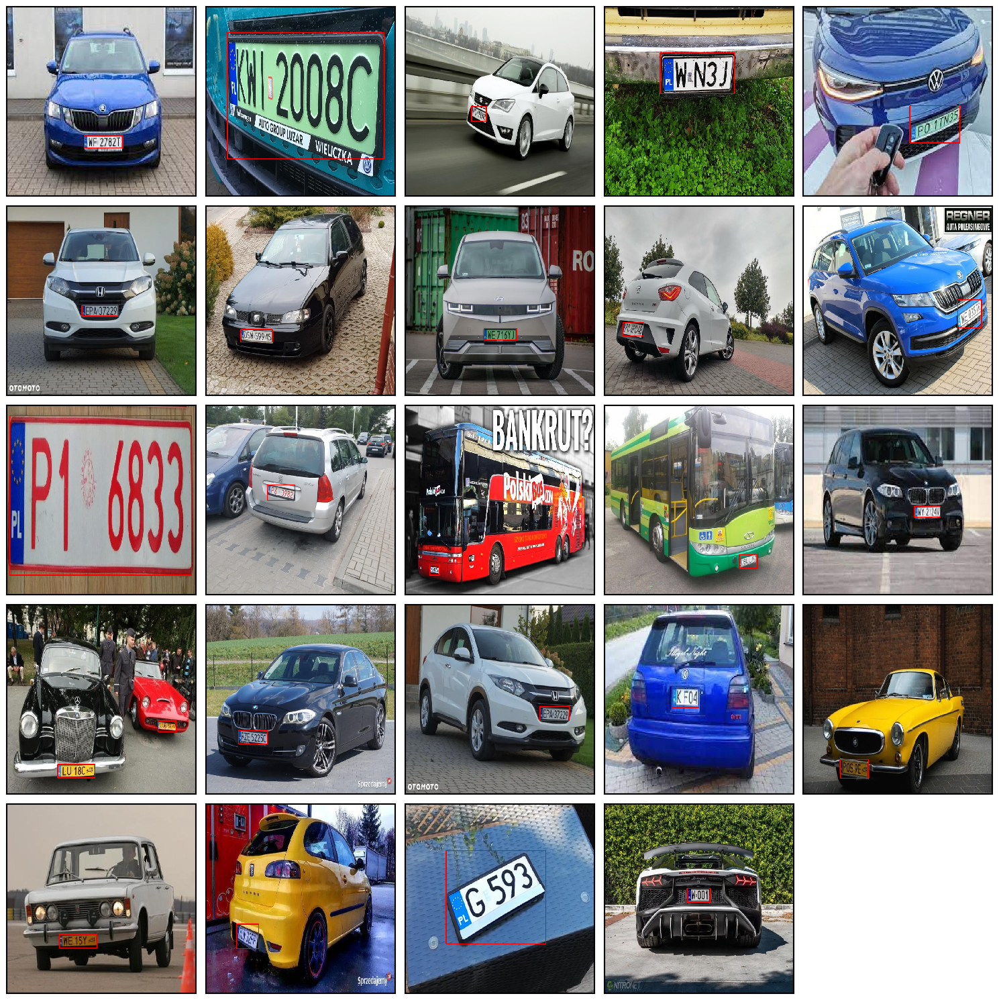

In [78]:
from notebooks.utils import show_collage


filenames = df["img_filename"].unique()
imgs = [cv2.imread(str(DIR / filename)) for filename in filenames]
plates = df.loc[df["cat_name"] == "license-plates"]
all_rects = plates.loc[:, "ann_bbox_xmin":"ann_bbox_ymax"].values.astype(int)
gt_rects = [all_rects[plates["img_filename"] == filename] for filename in filenames]


ann_gt = annotate(imgs, gt_rects)

show_collage(ann_gt)

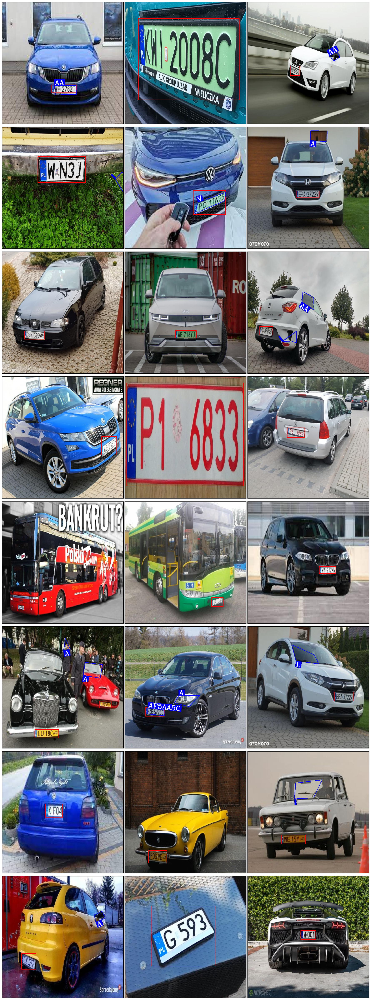

In [79]:
from twm_proj.licence_plate_detector import LicencePlateDetector

detector = LicencePlateDetector.default()

preds = [[*detector.detect(img)] for img in imgs]
pred_contours = [[plate.rect for plate in result] for result in preds]
pred_texts = [[plate.text for plate in result] for result in preds]

ann_preds = annotate(ann_gt, pred_contours, color=(255, 0, 0), texts=pred_texts)
show_collage(ann_preds, col_wrap=3, height=6)

In [80]:
from shapely.geometry import Polygon
from dataclasses import dataclass


def bounding_rect_contour(contour: np.ndarray) -> np.ndarray:
    xs, ys = contour.T
    x_min, x_max = xs.min(), xs.max()
    y_min, y_max = ys.min(), ys.max()
    return np.array([[x_min, y_min], [x_max, y_min], [x_max, y_min], [x_min, y_max]])


def rect_to_contour(rect: np.ndarray) -> np.ndarray:
    x1, y1, x2, y2 = rect
    return np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]])


def iou(cont1: np.ndarray, cont2: np.ndarray) -> float:
    poly1, poly2 = map(Polygon, [cont1, cont2])
    return poly1.intersection(poly2).area / poly1.union(poly2).area


@dataclass
class ConfusionMatrix:
    tp_cont: list[np.ndarray]
    fp_cont: list[np.ndarray]
    fn_cont: list[np.ndarray]

    @property
    def tp(self) -> float:
        return sum(len(lst) for lst in self.tp_cont)

    @property
    def fp(self) -> float:
        return sum(len(lst) for lst in self.fp_cont)

    @property
    def fn(self) -> float:
        return sum(len(lst) for lst in self.fn_cont)

    @property
    def accuracy(self) -> float:
        return self.tp / (self.tp + self.fp + self.fn)

    @property
    def precision(self) -> float:
        return self.tp / (self.tp + self.fp)

    @property
    def recall(self) -> float:
        return self.tp / (self.tp + self.fn)

    @classmethod
    def calculate(
        cls,
        gt_rects: list[np.ndarray],
        pred_contours: list[list[np.ndarray]],
        iou_treshold: float = 0.4,
    ):
        tp = []
        fp = []
        fn = []
        for gt_rect_set, pred_cont_set in [*zip(gt_rects, pred_contours)]:
            preds_rectified = [bounding_rect_contour(cont) for cont in pred_cont_set]
            gt_cont_set = [rect_to_contour(rect) for rect in gt_rect_set]
            ious = np.array(
                [
                    [iou(pred_cont, gt_cont) for pred_cont in preds_rectified]
                    for gt_cont in gt_cont_set
                ]
            )
            if ious.size == 0:
                tp.append([])
                fp.append([])
                fn.append(gt_cont_set)
                continue

            best_fits_i = ious.argmax(axis=1, keepdims=True)
            best_ious = np.take_along_axis(ious, best_fits_i, axis=1)

            best_fits_i = best_fits_i.flatten()
            correct = (best_ious >= iou_treshold).flatten()
            incorrect = np.invert(correct)

            tp.append([pred_cont_set[i] for i in best_fits_i[correct]])
            fp.append([pred_cont_set[i] for i in best_fits_i[incorrect]])
            fn.append([gt for gt, take in zip(gt_cont_set, incorrect) if take])
        return cls(tp_cont=tp, fp_cont=fp, fn_cont=fn)


conf_matrix = ConfusionMatrix.calculate(gt_rects, pred_contours)

print("true positives:\t\t", conf_matrix.tp)
print("false positives:\t", conf_matrix.fp)
print("false negatives:\t", conf_matrix.fn)
print("accuracy:\t\t", conf_matrix.accuracy)
print("precision:\t\t", conf_matrix.precision)
print("recall:\t\t\t", conf_matrix.recall)

true positives:		 2
false positives:	 10
false negatives:	 23
accuracy:		 0.05714285714285714
precision:		 0.16666666666666666
recall:			 0.08
